Uncover the factors that lead to employee attrition and explore important questions such as ‘show me a breakdown of distance from home by job role and attrition’ or ‘compare average monthly income by education and attrition’.
This is a fictional data set created by IBM data scientists.

Education 1 'Below College' 2 'College' 3 'Bachelor' 4 'Master' 5 'Doctor'

EnvironmentSatisfaction 1 'Low' 2 'Medium' 3 'High' 4 'Very High'

JobInvolvement
1 'Low' 2 'Medium' 3 'High' 4 'Very High'

JobSatisfaction 1 'Low' 2 'Medium' 3 'High' 4 'Very High'

PerformanceRating
1 'Low' 2 'Good' 3 'Excellent' 4 'Outstanding'

RelationshipSatisfaction
1 'Low' 2 'Medium' 3 'High' 4 'Very High'

WorkLifeBalance 1 'Bad' 2 'Good' 3 'Better' 4 'Best'

### Importing & Read Data

In [1]:
# importing libraries for data handling and analysis
import pandas as pd
import numpy as np
import statsmodels.api as sm
import warnings
warnings.filterwarnings('ignore')

In [2]:
# importing libraries for data visualisations
import seaborn as sns
from matplotlib import pyplot
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
# sklearn modules for preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler, FunctionTransformer
from imblearn.over_sampling import SMOTE  # SMOTE

# sklearn modules for ML model selection
from sklearn.model_selection import train_test_split  # import 'train_test_split'
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

# Libraries for data modelling

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
#from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

# Common sklearn Model Helpers
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics
# from sklearn.datasets import make_classification

# sklearn modules for performance metrics
from yellowbrick.classifier import ROCAUC
from sklearn.metrics import accuracy_score 
from sklearn.metrics import matthews_corrcoef, f1_score, classification_report, roc_auc_score, confusion_matrix, log_loss,make_scorer

In [4]:
IBM = pd.read_csv('IBM_HR_Employee_Attrition.csv')

In [5]:
pd.set_option('display.max_rows', 1500)
pd.set_option('display.max_columns', 75)
IBM.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Y,Yes,11,3,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,Y,No,23,4,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Y,Yes,15,3,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Y,Yes,11,3,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,Y,No,12,3,4,80,1,6,3,3,2,2,2,2


In [6]:
IBM.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
Age                         1470 non-null int64
Attrition                   1470 non-null object
BusinessTravel              1470 non-null object
DailyRate                   1470 non-null int64
Department                  1470 non-null object
DistanceFromHome            1470 non-null int64
Education                   1470 non-null int64
EducationField              1470 non-null object
EmployeeCount               1470 non-null int64
EmployeeNumber              1470 non-null int64
EnvironmentSatisfaction     1470 non-null int64
Gender                      1470 non-null object
HourlyRate                  1470 non-null int64
JobInvolvement              1470 non-null int64
JobLevel                    1470 non-null int64
JobRole                     1470 non-null object
JobSatisfaction             1470 non-null int64
MaritalStatus               1470 non-null object
MonthlyIncome         

In [7]:
IBM.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


>**Based on Table Describe above we know that EmployeeCount and StandardHours have zero for Std Score.**

In [8]:
IBM.isna().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [9]:
## Lets we are looking at Unique value from IBM Columns Dataset
for i in range(IBM.shape[1]):
    print (IBM.columns.values[i],":",np.unique(IBM[IBM.columns.values[i]]),"\n")

Age : [18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60] 

Attrition : ['No' 'Yes'] 

BusinessTravel : ['Non-Travel' 'Travel_Frequently' 'Travel_Rarely'] 

DailyRate : [ 102  103  104  105  106  107  109  111  115  116  117  118  119  120
  121  124  125  128  129  130  131  132  134  135  136  138  140  141
  142  143  144  145  146  147  148  150  152  153  154  155  156  157
  160  161  163  164  167  168  170  172  174  176  177  179  180  181
  182  185  188  189  192  193  194  195  196  199  200  201  202  203
  204  205  206  207  208  210  211  213  216  217  218  219  224  228
  230  231  232  234  237  238  240  241  243  244  247  248  249  251
  252  253  254  256  258  261  263  264  265  266  267  268  269  271
  277  279  280  282  285  286  287  288  289  290  294  296  299  300
  301  302  303  304  305  306  307  309  310  311  313  314  316  317
  318  319  322  325  326  328  329  330 

In [10]:
# Check duplicate EmployeeNumber that we know the coloumn is unique
IBM[IBM.duplicated('EmployeeNumber',keep = False)]

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,Over18,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager


In [11]:
IBM.duplicated('EmployeeNumber',keep = False).sum()

0

In [12]:
# Remove the irrelevant columns from the dataset and Remove EmployeeNumber which has unique value
IBM = IBM.drop(['EmployeeCount','EmployeeNumber','Over18','StandardHours'], axis=1)
IBM.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


In [13]:
IBM.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
Age                         1470 non-null int64
Attrition                   1470 non-null object
BusinessTravel              1470 non-null object
DailyRate                   1470 non-null int64
Department                  1470 non-null object
DistanceFromHome            1470 non-null int64
Education                   1470 non-null int64
EducationField              1470 non-null object
EnvironmentSatisfaction     1470 non-null int64
Gender                      1470 non-null object
HourlyRate                  1470 non-null int64
JobInvolvement              1470 non-null int64
JobLevel                    1470 non-null int64
JobRole                     1470 non-null object
JobSatisfaction             1470 non-null int64
MaritalStatus               1470 non-null object
MonthlyIncome               1470 non-null int64
MonthlyRate                 1470 non-null int64
NumCompaniesWorked    

In [14]:
## Check Object Columns. There is 8 object columns after drop some Columns.
cat_cols = IBM.columns[IBM.dtypes=='object']
IBM_cat = IBM[cat_cols]
print(cat_cols)
print(cat_cols.shape)
IBM_cat.head()

Index(['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender',
       'JobRole', 'MaritalStatus', 'OverTime'],
      dtype='object')
(8,)


,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,No


In [15]:
IBM['Attrition'].value_counts()

No     1233
Yes     237
Name: Attrition, dtype: int64

In [16]:
persen_attrition_no = (IBM['Attrition'].value_counts()[0]/len(IBM['Attrition']))*100
persen_attrition_yes = (IBM['Attrition'].value_counts()[1]/len(IBM['Attrition']))*100
print(f'Persentase banyaknya karyawan yang tidak meninggalkan perusahaan : {persen_attrition_no}')
print(f'Persentase banyaknya karyawan yang meninggalkan perusahaan : {persen_attrition_yes}') 

Persentase banyaknya karyawan yang tidak meninggalkan perusahaan : 83.87755102040816
Persentase banyaknya karyawan yang meninggalkan perusahaan : 16.122448979591837


### Preparing Dataset

Lets prepare our columns to be ready for machine learning activities.

#### Feature Encoding 


First, I have used the Dummy Encoder from the scikit library to encode all the categorical features, except the target column (Attrition). Also, set the drop_first parameter as True.

At the same time, change the Attrition feature value with No as 0 and Yes as 1.

In [17]:
IBM.head()

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobRole,JobSatisfaction,MaritalStatus,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,Female,94,3,2,Sales Executive,4,Single,5993,19479,8,Yes,11,3,1,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,Male,61,2,2,Research Scientist,2,Married,5130,24907,1,No,23,4,4,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,4,Male,92,2,1,Laboratory Technician,3,Single,2090,2396,6,Yes,15,3,2,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,Female,56,3,1,Research Scientist,3,Married,2909,23159,1,Yes,11,3,3,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,Male,40,3,1,Laboratory Technician,2,Married,3468,16632,9,No,12,3,4,1,6,3,3,2,2,2,2


In [18]:
IBM_cat.head()

,Attrition,BusinessTravel,Department,EducationField,Gender,JobRole,MaritalStatus,OverTime
0,Yes,Travel_Rarely,Sales,Life Sciences,Female,Sales Executive,Single,Yes
1,No,Travel_Frequently,Research & Development,Life Sciences,Male,Research Scientist,Married,No
2,Yes,Travel_Rarely,Research & Development,Other,Male,Laboratory Technician,Single,Yes
3,No,Travel_Frequently,Research & Development,Life Sciences,Female,Research Scientist,Married,Yes
4,No,Travel_Rarely,Research & Development,Medical,Male,Laboratory Technician,Married,No


In [19]:
## convert rest of categorical variable into dummy
IBM_dummies = pd.get_dummies(data = IBM, columns = ['BusinessTravel', 'Department',
                             'EducationField','Gender','JobRole','MaritalStatus','OverTime'],drop_first=True)
IBM_dummies['Attrition'] = IBM_dummies['Attrition'].replace({'No':0,'Yes':1})

In [20]:
IBM_dummies

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1,1102,1,2,2,94,3,2,4,5993,19479,8,11,3,1,0,8,0,1,6,4,0,5,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
1,49,0,279,8,1,3,61,2,2,2,5130,24907,1,23,4,4,1,10,3,3,10,7,1,7,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
2,37,1,1373,2,2,4,92,2,1,3,2090,2396,6,15,3,2,0,7,3,3,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1
3,33,0,1392,3,4,4,56,3,1,3,2909,23159,1,11,3,3,0,8,3,3,8,7,3,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
4,27,0,591,2,1,1,40,3,1,2,3468,16632,9,12,3,4,1,6,3,3,2,2,2,2,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0
5,32,0,1005,2,2,4,79,3,1,4,3068,11864,0,13,3,3,0,8,2,2,7,7,3,6,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0
6,59,0,1324,3,3,3,81,4,1,1,2670,9964,4,20,4,1,3,12,3,2,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1
7,30,0,1358,24,1,4,67,3,1,3,2693,13335,1,22,4,2,1,1,2,3,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
8,38,0,216,23,3,4,44,2,3,3,9526,8787,0,21,4,2,0,10,2,3,9,7,1,8,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
9,36,0,1299,27,3,3,94,3,2,3,5237,16577,6,13,3,2,2,17,3,2,7,7,7,7,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [23]:
IBM_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 45 columns):
Age                                  1470 non-null int64
Attrition                            1470 non-null int64
DailyRate                            1470 non-null int64
DistanceFromHome                     1470 non-null int64
Education                            1470 non-null int64
EnvironmentSatisfaction              1470 non-null int64
HourlyRate                           1470 non-null int64
JobInvolvement                       1470 non-null int64
JobLevel                             1470 non-null int64
JobSatisfaction                      1470 non-null int64
MonthlyIncome                        1470 non-null int64
MonthlyRate                          1470 non-null int64
NumCompaniesWorked                   1470 non-null int64
PercentSalaryHike                    1470 non-null int64
PerformanceRating                    1470 non-null int64
RelationshipSatisfaction             1

#### Preprocessing (Feature Scaling.)
The scikit library provides various types of scalers. Below I have used the StandardScaler to scale the data.

In [24]:
scaler = StandardScaler()
IBM_dummies_standard = IBM_dummies.copy()
IBM_dummies_standard.drop(['Attrition'],axis = 1, inplace = True)

In [25]:
IBM_dummies_standard

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1102,1,2,2,94,3,2,4,5993,19479,8,11,3,1,0,8,0,1,6,4,0,5,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
1,49,279,8,1,3,61,2,2,2,5130,24907,1,23,4,4,1,10,3,3,10,7,1,7,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
2,37,1373,2,2,4,92,2,1,3,2090,2396,6,15,3,2,0,7,3,3,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1
3,33,1392,3,4,4,56,3,1,3,2909,23159,1,11,3,3,0,8,3,3,8,7,3,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
4,27,591,2,1,1,40,3,1,2,3468,16632,9,12,3,4,1,6,3,3,2,2,2,2,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0
5,32,1005,2,2,4,79,3,1,4,3068,11864,0,13,3,3,0,8,2,2,7,7,3,6,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0
6,59,1324,3,3,3,81,4,1,1,2670,9964,4,20,4,1,3,12,3,2,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1
7,30,1358,24,1,4,67,3,1,3,2693,13335,1,22,4,2,1,1,2,3,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
8,38,216,23,3,4,44,2,3,3,9526,8787,0,21,4,2,0,10,2,3,9,7,1,8,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
9,36,1299,27,3,3,94,3,2,3,5237,16577,6,13,3,2,2,17,3,2,7,7,7,7,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [26]:
scaler.fit(IBM_dummies_standard)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [27]:
scaled_data = scaler.transform(IBM_dummies_standard)

#### Data and Target

In [28]:
X = pd.DataFrame(scaled_data,columns = IBM_dummies_standard.columns)
y = IBM_dummies['Attrition']
concat_scaled_data = pd.concat([X,y],axis = 1)
concat_scaled_data.head()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes,Attrition
0,0.446350,0.742527,-1.010909,-0.891688,-0.660531,1.383138,0.379672,-0.057788,1.153254,-0.108350,0.726020,2.125136,-1.150554,-0.426230,-1.584178,-0.932014,-0.421642,-2.171982,-2.493820,-0.164613,-0.063296,-0.679146,0.245834,-0.481859,0.639841,-1.374051,1.515244,1.194045,-0.348255,-0.679141,-0.243059,-0.314093,-1.224745,-0.191498,-0.462464,-0.273059,-0.330808,-0.239904,-0.497873,1.873287,-0.244625,-0.918921,1.458650,1.591746,1
1,1.322365,-1.297775,-0.147150,-1.868426,0.254625,-0.240677,-1.026167,-0.057788,-0.660853,-0.291719,1.488876,-0.678049,2.129306,2.346151,1.191438,0.241988,-0.164511,0.155707,0.338096,0.488508,0.764998,-0.368715,0.806541,2.075297,-1.562889,0.727775,-0.659960,1.194045,-0.348255,-0.679141,-0.243059,-0.314093,0.816497,-0.191498,-0.462464,-0.273059,-0.330808,-0.239904,2.008543,-0.533821,-0.244625,1.088232,-0.685565,-0.628241,0
2,0.008343,1.414363,-0.887515,-0.891688,1.169781,1.284725,-1.026167,-0.961486,0.246200,-0.937654,-1.674841,1.324226,-0.057267,-0.426230,-0.658973,-0.932014,-0.550208,0.155707,0.338096,-1.144294,-1.167687,-0.679146,-1.155935,-0.481859,0.639841,0.727775,-0.659960,-0.837490,-0.348255,-0.679141,4.114223,-0.314093,0.816497,-0.191498,2.162331,-0.273059,-0.330808,-0.239904,-0.497873,-0.533821,-0.244625,-0.918921,1.458650,1.591746,1
3,-0.429664,1.461466,-0.764121,1.061787,1.169781,-0.486709,0.379672,-0.961486,0.246200,-0.763634,1.243211,-0.678049,-1.150554,-0.426230,0.266233,-0.932014,-0.421642,0.155707,0.338096,0.161947,0.764998,0.252146,-1.155935,2.075297,-1.562889,0.727775,-0.659960,1.194045,-0.348255,-0.679141,-0.243059,-0.314093,-1.224745,-0.191498,-0.462464,-0.273059,-0.330808,-0.239904,2.008543,-0.533821,-0.244625,1.088232,-0.685565,1.591746,0
4,-1.086676,-0.524295,-0.887515,-1.868426,-1.575686,-1.274014,0.379672,-0.961486,-0.660853,-0.644858,0.325900,2.525591,-0.877232,-0.426230,1.191438,0.241988,-0.678774,0.155707,0.338096,-0.817734,-0.615492,-0.058285,-0.595227,-0.481859,0.639841,0.727775,-0.659960,-0.837490,-0.348255,1.472448,-0.243059,-0.314093,0.816497,-0.191498,2.162331,-0.273059,-0.330808,-0.239904,-0.497873,-0.533821,-0.244625,1.088232,-0.685565,-0.628241,0


#### Splitting the data into training and validation sets

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=101)

In [30]:
## X_train info after drop Attrition
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1029 entries, 1464 to 863
Data columns (total 44 columns):
Age                                  1029 non-null float64
DailyRate                            1029 non-null float64
DistanceFromHome                     1029 non-null float64
Education                            1029 non-null float64
EnvironmentSatisfaction              1029 non-null float64
HourlyRate                           1029 non-null float64
JobInvolvement                       1029 non-null float64
JobLevel                             1029 non-null float64
JobSatisfaction                      1029 non-null float64
MonthlyIncome                        1029 non-null float64
MonthlyRate                          1029 non-null float64
NumCompaniesWorked                   1029 non-null float64
PercentSalaryHike                    1029 non-null float64
PerformanceRating                    1029 non-null float64
RelationshipSatisfaction             1029 non-null float64
StockO

In [31]:
y_train.value_counts()

0    862
1    167
Name: Attrition, dtype: int64

### Modelling
>The algorithms considered in this section are: **Logistic Regression**, **Decision Tree**, **Random Forest**, **KNN**.

In [62]:
### Logistic Regression : 
## Model klasifikasi dasar. 
## Dengan menggunakan Logistic Regression kita bisa menjelaskan hubungan dari masing-masing Features.


### Decision Tree :
## Model klasifikasi dasar.
## Sering dipakai untuk klasifikasi, karena dia merupakan machine detector untuk suatu kondisi(Bisa untuk Binary/Multi Class).
## Yang dicari di Decision Trees adalah Purity, karena yang dicari Gini Index dan Entropy.
## Kita cuma mau cari data kita di spliting, cari di Feature mana yang bagus sekali untuk membagi data kita, 
## dinilai dari impurity (yang semurni mungkin).


### Random Forest :
## dipakai untuk menghindari Model yang Overfitting, yang secara acak.
## Kita bisa saja tidak pakai bootstrap hanya menggunakan data kita biasa.
## Dia gak begitu bagus untuk data yang kecil atau sedikit.
## Random Forest & Decision Trees untuk prediktif (prediksi) bukan deskriptif.
## Dari Random Forest tidak bisa menjelaskan benar-benar hubungan antara Independent dan Dependent Variablenya,
## jadi kurang cocok untuk deskriptif.

#### Handling the Imbalanced dataset

>Note that we have a imbalanced dataset with majority of observations being of one type ('NO') in our case. In this dataset for example we have about 84 % of observations having 'No' and only 16 % of 'Yes' and hence this is an imbalanced dataset.

>To deal with such a imbalanced dataset we have to take certain measures, otherwise the performance of our model can be significantly affected. In this section I have discussed two approaches to curb such datasets.

##### Oversampling the Minority or Undersampling the Majority Class

>In an imbalanced dataset the main problem is that the data is highly skewed ie the number of observations of certain class is more than that of the other. Therefore what we do in this approach is to either increase the number of observations corressponding to the minority class (oversampling) or decrease the number of observations for the majority class (undersampling).

>Note that in our case the number of observations is already pretty low and so oversampling will be more appropriate.

>Below I have used an oversampling technique known as the SMOTE(Synthetic Minority Oversampling Technique) which randomly creates some 'Synthetic' instances of the minority class so that the net observations of both the class get balanced out.

>One thing more to take of is to use the SMOTE before the cross validation step; just to ensure that our model does not overfit the data; just as in the case of feature selection.

In [32]:
#Resample the minority class. You can charge the strategy to 'auto' if you are not sure.
smote = SMOTE(sampling_strategy = 'minority',random_state = 101)
X_train_os, y_train_os = smote.fit_sample(X_train, y_train)

In [33]:
X_train_os = pd.DataFrame(X_train_os, columns = X_train.columns)
y_train_os = pd.DataFrame(y_train_os, columns = ['Attrition'])

In [34]:
y_train_os['Attrition'].value_counts()

1    862
0    862
Name: Attrition, dtype: int64

The Normal X_train Data

In [35]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1029 entries, 1464 to 863
Data columns (total 44 columns):
Age                                  1029 non-null float64
DailyRate                            1029 non-null float64
DistanceFromHome                     1029 non-null float64
Education                            1029 non-null float64
EnvironmentSatisfaction              1029 non-null float64
HourlyRate                           1029 non-null float64
JobInvolvement                       1029 non-null float64
JobLevel                             1029 non-null float64
JobSatisfaction                      1029 non-null float64
MonthlyIncome                        1029 non-null float64
MonthlyRate                          1029 non-null float64
NumCompaniesWorked                   1029 non-null float64
PercentSalaryHike                    1029 non-null float64
PerformanceRating                    1029 non-null float64
RelationshipSatisfaction             1029 non-null float64
StockO

The oversampled X_train data

In [36]:
X_train_os.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1724 entries, 0 to 1723
Data columns (total 44 columns):
Age                                  1724 non-null float64
DailyRate                            1724 non-null float64
DistanceFromHome                     1724 non-null float64
Education                            1724 non-null float64
EnvironmentSatisfaction              1724 non-null float64
HourlyRate                           1724 non-null float64
JobInvolvement                       1724 non-null float64
JobLevel                             1724 non-null float64
JobSatisfaction                      1724 non-null float64
MonthlyIncome                        1724 non-null float64
MonthlyRate                          1724 non-null float64
NumCompaniesWorked                   1724 non-null float64
PercentSalaryHike                    1724 non-null float64
PerformanceRating                    1724 non-null float64
RelationshipSatisfaction             1724 non-null float64
StockOpt

#### Using the Right Evaluation Metric

>Employee turn-over (also known as "employee churn") is a costly problem for companies. The true cost of replacing an employee can often be quite large. A study by the Center for American Progress found that companies typically pay about one-fifth of an employee’s salary to replace that employee, and the cost can significantly increase if executives or highest-paid employees are to be replaced. In other words, the cost of replacing employees for most employers remains significant. This is due to the amount of time spent to interview and find a replacement, sign-on bonuses, and the loss of productivity for several months while the new employee gets accustomed to the new role.

>Based on the reason abpve so for this case, I will try to optimize **the accuracy score** of my machine learning model. I choose this metric because the company's intention is **to correctly predict if a employee will likely to leave or not**. If my model has high accuracy, **it will help the company's to make better decision on how to maintain employee that are predicted to Attrition**.

In [37]:
def calc_acc(X_train, y_train, X_test, y_test, model):
    model.fit(X_train, y_train)
    return accuracy_score(y_train, model.predict(X_train)), accuracy_score(y_test, model.predict(X_test))

# def calc_train_error(X_train, y_train, model):
#     predictions = model.predict(X_train)
#     predictProba = model.predict_proba(X_train)
#     roc_auc = roc_auc_score(y_train, predictProba[:,1])
#     accuracy = accuracy_score(y_train, predictions)
#     return {
# #         'roc' : roc_auc,
#         'accuracy' : accuracy,
#     }

# def calc_validation_error(X_test, y_test, model) :
#     predictions = model.predict(X_test)
#     predictProba = model.predict_proba(X_test)
#     roc_auc = roc_auc_score(y_test, predictProba[:,1])
#     accuracy = accuracy_score(y_test, predictions)
#     return {
# #         'roc' : roc_auc,
#         'accuracy' : accuracy,
#     }

# def calc_metrics(X_train, y_train, X_test, y_test, model):
#     model.fit(X_train, y_train)
#     train_error = calc_train_error(X_train, y_train, model)
#     validation_error = calc_validation_error(X_test, y_test, model)
#     return train_error, validation_error
         

In [56]:
logistic = LogisticRegression(random_state = 101)
Original_data = pd.DataFrame(calc_acc(X_train, y_train, X_test, y_test, logistic),
                index = ['Train Normal Data','Test Normal Data'],columns = ['Accuracy'])
print(Original_data)
print('\n')
Oversampled_data = pd.DataFrame(calc_acc(X_train_os, y_train_os, X_test, y_test, logistic),
                   index = ['Train Oversample Data','Test Oversample Data'],columns = ['Accuracy'])
print(Oversampled_data)

                   Accuracy
Train Normal Data  0.900875
Test Normal Data   0.879819


                       Accuracy
Train Oversample Data  0.831206
Test Oversample Data   0.777778


In [57]:
dtree = DecisionTreeClassifier(random_state = 101)
Original_data = pd.DataFrame(calc_acc(X_train, y_train, X_test, y_test, dtree),
                index = ['Train Normal Data','Test Normal Data'],columns = ['Accuracy'])
print(Original_data)
print('\n')
Oversampled_data = pd.DataFrame(calc_acc(X_train_os, y_train_os, X_test, y_test, dtree),
                   index = ['Train Oversample Data','Test Oversample Data'], columns =['Accuracy'])
print(Oversampled_data)

                   Accuracy
Train Normal Data  1.000000
Test Normal Data   0.786848


                       Accuracy
Train Oversample Data  1.000000
Test Oversample Data   0.768707


In [58]:
rf = RandomForestClassifier(random_state = 101)
Original_data = pd.DataFrame(calc_acc(X_train, y_train, X_test, y_test, rf),
                index = ['Train Normal Data','Test Normal Data'],columns = ['Accuracy'])
print(Original_data)
print('\n')
Oversampled_data = pd.DataFrame(calc_acc(X_train_os, y_train_os, X_test, y_test, rf),
                   index = ['Train Oversample Data','Test Oversample Data'],columns = ['Accuracy'])
print(Oversampled_data)

                   Accuracy
Train Normal Data  0.979592
Test Normal Data   0.843537


                       Accuracy
Train Oversample Data   0.99420
Test Oversample Data    0.84127


In [40]:
knn = KNeighborsClassifier()
Original_data = pd.DataFrame(calc_acc(X_train, y_train, X_test, y_test, knn),
                index = ['Train Normal Data','Test Normal Data'],columns = ['Accuracy'])
print(Original_data)
print('\n')
Oversampled_data = pd.DataFrame(calc_acc(X_train_os, y_train_os, X_test, y_test, knn),
                   index = ['Train Oversample Data','Test Oversample Data'],columns =['Accuracy'])
print(Oversampled_data)

                   Accuracy
Train Normal Data  0.874636
Test Normal Data   0.848073


                       Accuracy
Train Oversample Data  0.868329
Test Oversample Data   0.609977


In [146]:
# xgb = XGBClassifier()
# Original_data = pd.DataFrame(calc_acc(X_train, y_train, X_test, y_test, xgb),
#                 index = ['Train Normal Data','Test Normal Data'],columns = 'Accuracy')
# print(Original_data)
# print('\n')
# Oversampled_data = pd.DataFrame(calc_acc(X_train_os, y_train_os, X_test, y_test, xgb),
#                    index = ['Train Oversample Data','Test Oversample Data'] = 'Accuracy')
# print(Oversampled_data)

                          0
Train Normal Data  0.955296
Test Normal Data   0.866213


                              0
Train Oversample Data  0.971578
Test Oversample Data   0.852608


>Based on **accuracy score**, all five model are quite consistent and stable to calculate accuracy score both original data and oversampled data. KNN and Decision Tree have the bad score on oversampled data while the other models have better scores on oversampled data. 

>Probably why the accuracy score using KNN is not good enough due to the data don't match using the approach that uses distance. This is due to the close range of data.
The accuracy score of the Decision Tree is not good because basically the weakness of using the Decision Tree is often overfitting.

#### Hyperparameter Tuning (Optimize)

##### Original Data (ROC AUC Scoring)

In [40]:
# ## Logistic regression
# logistic_random_auc = RandomizedSearchCV(estimator = logistic,
#                                          param_distributions = {
#                                         'penalty' : ['l1', 'l2'],
#                                         'C' : [0.2, 0.4, 0.6, 0.8, 1.0],
#                                         'fit_intercept' : [True, False],
#                                         'class_weight' : [None, {0 : 1, 1 : 4}, {0 : 1, 1 : 5}],
#                                      },
#                                      n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# logistic_random_auc.fit(X_train, y_train)
# print(f'ROC AUC Original Logistic Regression: {logistic_random_auc.best_score_}')

# ## Decision Tree
# dtree_random_auc = RandomizedSearchCV(estimator = dtree,
#                                       param_distributions = {
#                                         'criterion': ['gini','entropy'],
#                                         'max_depth' : [None, 10, 20],
#                                         'max_features' : ['auto', 'sqrt'],
#                                         'max_depth' : [None, 10, 20],
#                                         'min_samples_split' : [10, 20, 30, 40, 50],
#                                         'min_samples_leaf' : [1, 3, 5, 7, 9],
#                                         'class_weight' : [None, {0 : 1, 1 : 4}, {0 : 1, 1 : 5}]                         
#                                       },
#                                       n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# dtree_random_auc.fit(X_train, y_train)
# print(f'ROC AUC Original Decision Tree: {dtree_random_auc.best_score_}')
                                                                                                              
# ## Random forest (Boostrap)
# rf_random_auc = RandomizedSearchCV(estimator = rf,
#                                    param_distributions = {
#                                     'n_estimators' : [100, 200, 300],
#                                     'criterion' : ['gini', 'entropy'],
#                                     'max_features' : ['auto', 'sqrt'],
#                                     'max_depth' : [None, 10, 20],
#                                     'min_samples_split' : [10, 20, 30, 40, 50],
#                                     'min_samples_leaf' : [1, 3, 5, 7, 9],
#                                     'bootstrap' : [True, False],
#                                     'class_weight' : [None, {0 : 1, 1 : 4}, {0 : 1, 1 : 5}] 
#                                    },
#                                    n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# rf_random_auc.fit(X_train, y_train)
# print(f'ROC AUC Original Random Forest: {rf_random_auc.best_score_}')


# ## KNN (KNeighborsClassifier)
# knn_random_auc = RandomizedSearchCV(estimator = knn,
#                                     param_distributions = {
#                                         'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
#                                         'n_neighbors' : [1,2],
#                                         'weights' : ['uniform','distance']
#                                     },
#                                     n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# knn_random_auc.fit(X_train, y_train)
# print(f'ROC AUC Original KNN: {knn_random_auc.best_score_}')


# ## XGBoost
# xgb_random_auc = RandomizedSearchCV(estimator = xgb,
#                                     param_distributions = {
#                                       'max_depth' : [3, 4, 5],
#                                       'learning_rate' : [0.01, 0.05, 0.1],
#                                       'n_estimators' : [100, 200, 300],
#                                       'booster' : ['gbtree', 'gblinear', 'dart']
#                                     },
#                                     n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# xgb_random_auc.fit(X_train, y_train)
# print(f'ROC AUC Original XGBoost: {xgb_random_auc.best_score_}')

##### Oversampled Data (ROC AUC Scoring)

In [41]:
# ## Logistic regression
# logistic_random_os_auc = RandomizedSearchCV(estimator = logistic,
#                                             param_distributions = {
#                                                 'penalty' : ['l1', 'l2'],
#                                                 'C' : [0.2, 0.4, 0.6, 0.8, 1.0],
#                                                 'fit_intercept' : [True, False],
#                                             },
#                                             n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# logistic_random_os_auc.fit(X_train_os, y_train_os)
# print(f'ROC AUC Oversampled Logistic Regression: {logistic_random_os_auc.best_score_}')

# ## Decision Tree
# dtree_random_os_auc = RandomizedSearchCV(estimator = dtree,
#                                          param_distributions = {
#                                             'criterion': ['gini','entropy'],
#                                             'max_depth' : [None, 10, 20],
#                                             'max_features' : ['auto', 'sqrt'],
#                                             'max_depth' : [None, 10, 20],
#                                             'min_samples_split' : [10, 20, 30, 40, 50],
#                                             'min_samples_leaf' : [1, 3, 5, 7, 9],                       
#                                          },
#                                          n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# dtree_random_os_auc.fit(X_train_os, y_train_os)
# print(f'ROC AUC Oversampled Decision Tree: {dtree_random_os_auc.best_score_}')
                                                                                                              
# ## Random forest (Boostrap)
# rf_random_os_auc = RandomizedSearchCV(estimator = rf,
#                                       param_distributions = {
#                                         'n_estimators' : [100, 200, 300],
#                                         'criterion' : ['gini', 'entropy'],
#                                         'max_features' : ['auto', 'sqrt'],
#                                         'max_depth' : [None, 10, 20],
#                                         'min_samples_split' : [10, 20, 30, 40, 50],
#                                         'min_samples_leaf' : [1, 3, 5, 7, 9],
#                                         'bootstrap' : [True, False],
#                                       },
#                                       n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# rf_random_os_auc.fit(X_train_os, y_train_os)
# print(f'ROC AUC Oversampled Random Forest: {rf_random_os_auc.best_score_}')


# ## KNN (KNeighborsClassifier)
# knn_random_os_auc= RandomizedSearchCV(estimator = knn,
#                                       param_distributions = {
#                                         'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
#                                         'n_neighbors' : [1,2],
#                                         'weights' : ['uniform','distance']
#                                       },
#                                       n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# knn_random_os_auc.fit(X_train_os, y_train_os)
# print(f'ROC AUC Oversampled KNN: {knn_random_os_auc.best_score_}')

# ## XGBoost
# xgb_random_os_auc = RandomizedSearchCV(estimator = xgb,
#                                        param_distributions = {
#                                           'max_depth' : [3, 4, 5],
#                                           'learning_rate' : [0.01, 0.05, 0.1],
#                                           'n_estimators' : [100, 200, 300],
#                                           'booster' : ['gbtree', 'gblinear', 'dart']
#                                         },
#                                         n_iter =  20, cv = 5, n_jobs = -1, scoring = 'roc_auc')
# xgb_random_os_auc.fit(X_train_os, y_train_os)
# print(f'ROC AUC Oversampled XGBoost: {xgb_random_os_auc.best_score_}')

In [42]:
# rf_random_os_auc.best_params_

##### Original Data (Accuracy Scoring)

In [41]:
## Logistic regression
logistic_random_acc = RandomizedSearchCV(estimator = logistic,
                                         param_distributions = {
                                            'penalty' : ['l1', 'l2'],
                                            'C' : [0.2, 0.4, 0.6, 0.8, 1.0],
                                            'fit_intercept' : [True, False],
                                            'class_weight' : [None, {0 : 1, 1 : 4}, {0 : 1, 1 : 5}],
                                         },
                                         n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
logistic_random_acc.fit(X_train, y_train)
print(f'Accuracy Original Logistic Regression: {logistic_random_acc.best_score_}')

## Decision Tree
dtree_random_acc = RandomizedSearchCV(estimator = dtree,
                                      param_distributions = {
                                        'criterion': ['gini','entropy'],
                                        'max_depth' : [None, 10, 20],
                                        'max_features' : ['auto', 'sqrt'],
                                        'max_depth' : [None, 10, 20],
                                        'min_samples_split' : [10, 20, 30, 40, 50],
                                        'min_samples_leaf' : [1, 3, 5, 7, 9],
                                        'class_weight' : [None, {0 : 1, 1 : 4}, {0 : 1, 1 : 5}]                         
                                      },
                                      n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
dtree_random_acc.fit(X_train, y_train)
print(f'Accuracy Original Decision Tree: {dtree_random_acc.best_score_}')
                                                                                                              
## Random forest (Boostrap)
rf_random_acc = RandomizedSearchCV(estimator = rf,
                                   param_distributions = {
                                    'n_estimators' : [100, 200, 300],
                                    'criterion' : ['gini', 'entropy'],
                                    'max_features' : ['auto', 'sqrt'],
                                    'max_depth' : [None, 10, 20],
                                    'min_samples_split' : [10, 20, 30, 40, 50],
                                    'min_samples_leaf' : [1, 3, 5, 7, 9],
                                    'bootstrap' : [True, False],
                                    'class_weight' : [None, {0 : 1, 1 : 4}, {0 : 1, 1 : 5}] 
                                  },
                                  n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
rf_random_acc.fit(X_train, y_train)
print(f'Accuracy Original Random Forest: {rf_random_acc.best_score_}')


## KNN (KNeighborsClassifier)
knn_random_acc = RandomizedSearchCV(estimator = knn,
                                    param_distributions = {
                                        'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
                                        'n_neighbors' : [1,2],
                                        'weights' : ['uniform','distance']
                                    },
                                    n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
knn_random_acc.fit(X_train, y_train)
print(f'Accuracy Original KNN: {knn_random_acc.best_score_}')

## XGBoost
# xgb_random_acc = RandomizedSearchCV(estimator = xgb,
#                                     param_distributions = {
#                                       'max_depth' : [3, 4, 5],
#                                       'learning_rate' : [0.01, 0.05, 0.1],
#                                       'n_estimators' : [100, 200, 300],
#                                       'booster' : ['gbtree', 'gblinear', 'dart']
#                                     },
#                                     n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
# xgb_random_acc.fit(X_train, y_train)
# print(f'Accuracy Original XGBoost: {xgb_random_acc.best_score_}')

Accuracy Original Logistic Regression: 0.8833819241982507
Accuracy Original Decision Tree: 0.8289601554907677
Accuracy Original Random Forest: 0.8600583090379009
Accuracy Original KNN: 0.8435374149659864


##### Oversampled Data (Accuracy Scoring)

In [42]:
## Logistic regression
logistic_random_os_acc = RandomizedSearchCV(estimator = logistic,
                                            param_distributions = {
                                                'penalty' : ['l1', 'l2'],
                                                'C' : [0.2, 0.4, 0.6, 0.8, 1.0],
                                                'fit_intercept' : [True, False],
                                            },
                                            n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
logistic_random_os_acc.fit(X_train_os, y_train_os)
print(f'Accuracy Oversampled Logistic Regression: {logistic_random_os_acc.best_score_}')

## Decision Tree
dtree_random_os_acc = RandomizedSearchCV(estimator = dtree,
                                         param_distributions = {
                                            'criterion': ['gini','entropy'],
                                            'max_depth' : [None, 10, 20],
                                            'max_features' : ['auto', 'sqrt'],
                                            'max_depth' : [None, 10, 20],
                                            'min_samples_split' : [10, 20, 30, 40, 50],
                                            'min_samples_leaf' : [1, 3, 5, 7, 9],                       
                                         },
                                         n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
dtree_random_os_acc.fit(X_train_os, y_train_os)
print(f'Accuracy Oversampled Decision Tree: {dtree_random_os_acc.best_score_}')
                                                                                                              
## Random forest (Boostrap)
rf_random_os_acc = RandomizedSearchCV(estimator = rf,
                                      param_distributions = {
                                        'n_estimators' : [100, 200, 300],
                                        'criterion' : ['gini', 'entropy'],
                                        'max_features' : ['auto', 'sqrt'],
                                        'max_depth' : [None, 10, 20],
                                        'min_samples_split' : [10, 20, 30, 40, 50],
                                        'min_samples_leaf' : [1, 3, 5, 7, 9],
                                        'bootstrap' : [True, False],
                                      },
                                      n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
rf_random_os_acc.fit(X_train_os, y_train_os)
print(f'Accuracy Oversampled Random Forest: {rf_random_os_acc.best_score_}')


## KNN (KNeighborsClassifier)
knn_random_os_acc= RandomizedSearchCV(estimator = knn,
                                      param_distributions = {
                                        'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
                                        'n_neighbors' : [1,2],
                                        'weights' : ['uniform','distance']
                                      },
                                      n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
knn_random_os_acc.fit(X_train_os, y_train_os)
print(f'Accuracy Oversampled KNN: {knn_random_os_acc.best_score_}')

## XGBoost
# xgb_random_os_acc = RandomizedSearchCV(estimator = xgb,
#                                        param_distributions = {
#                                           'max_depth' : [3, 4, 5],
#                                           'learning_rate' : [0.01, 0.05, 0.1],
#                                           'n_estimators' : [100, 200, 300],
#                                           'booster' : ['gbtree', 'gblinear', 'dart']
#                                         },
#                                         n_iter =  20, cv = 5, n_jobs = -1, scoring = 'accuracy')
# xgb_random_os_acc.fit(X_train_os, y_train_os)
# print(f'Accuracy Original XGBoost: {xgb_random_os_acc.best_score_}')


Accuracy Oversampled Logistic Regression: 0.8213457076566125
Accuracy Oversampled Decision Tree: 0.8317865429234339
Accuracy Oversampled Random Forest: 0.929814385150812
Accuracy Oversampled KNN: 0.8938515081206496


>**Looking at the result, Random Forest on oversampled data yields the best accuracy score. Let's see the best parameters for this model.**

In [45]:
rf_random_os_acc.best_params_

{'n_estimators': 100,
 'min_samples_split': 10,
 'min_samples_leaf': 5,
 'max_features': 'auto',
 'max_depth': 20,
 'criterion': 'gini',
 'bootstrap': False}

In [38]:
rf_os_best_acc = RandomForestClassifier(n_estimators = 100, min_samples_split = 10, min_samples_leaf = 5,
                                        max_features = 'auto', max_depth = 20, criterion = 'gini', bootstrap = False,random_state = 101)

In [39]:
print(f'Accuracy Train Oversampled Data with The Best High Parameter: {calc_acc(X_train_os, y_train_os, X_test, y_test, rf_os_best_acc)[0]}')
print(f'Accuracy Test Oversampled Data with The Best High Parameter: {calc_acc(X_train_os, y_train_os, X_test, y_test, rf_os_best_acc)[1]}')

Accuracy Train Oversampled Data with The Best High Parameter: 0.9912993039443155
Accuracy Test Oversampled Data with The Best High Parameter: 0.8594104308390023


> **Conclusion from the result above :**
- There is overfitting of the accuracy result of the oversampled train and test data.
- I assume this happened maybe because of lack of data. 
- The alternative is that we take data again or we can doing Features Selection.

#### Features Selection (Feature Importances & Permutation)

> The feature Selection is one of the main steps of the preprocessing phase as the features which we choose directly effects the model performance. While some of the features seem to be less useful in terms of the context; others seem to equally useful. The better features we use the better our model will perform.

##### Random Forest

In [27]:
rf_os_best_acc = RandomForestClassifier(n_estimators = 100, min_samples_split = 10, min_samples_leaf = 5,
                                        max_features = 'auto', max_depth = 20, criterion = 'gini', bootstrap = False,random_state = 101)

In [40]:
rf_os_best_acc.fit(X_train_os, y_train_os)

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=20, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)

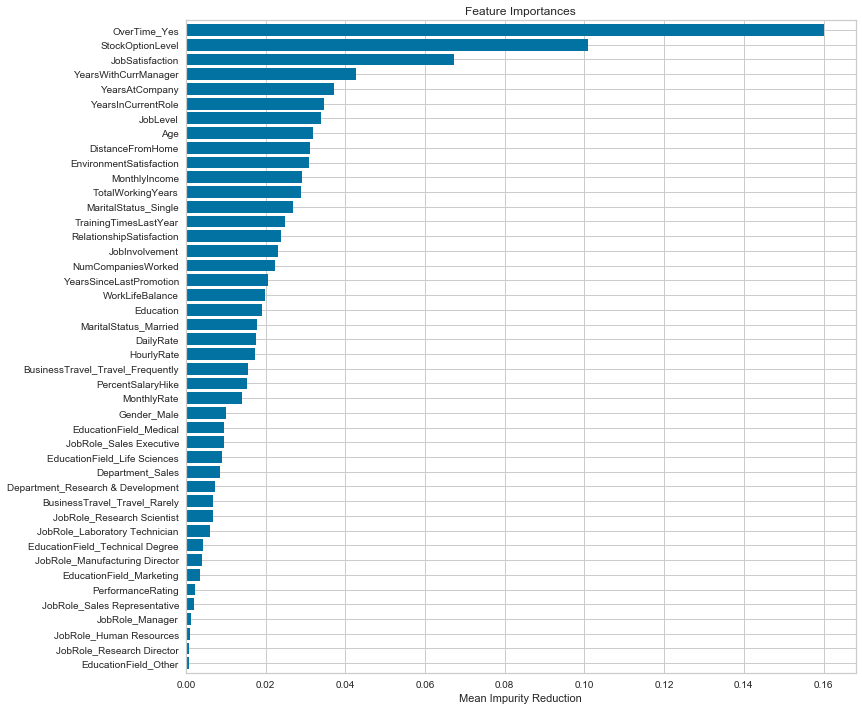

In [169]:
## Feature Importances
data_feature = pd.Series(rf_os_best_acc.feature_importances_, X_train.columns).sort_values()
data_feature.plot(kind = 'barh', title = 'Feature Importances', width = 0.8, figsize = (12, 12))
plt.xlabel('Mean Impurity Reduction')
plt.savefig('Feature_Importance.jpg')

> **Feature Importance can be said as a benchmark for the amount of contribution of various feature data trained to the performance of a prediction model.**

>**From the plot above, we can see that the Overtime most helped our model to determine the Attrition'No' or 'Yes'.**

In [181]:
## Permutation untuk melihat kestabilan features kita kalau seandainya posisi features diacak-acak lokasinya.
from eli5 import show_weights
from eli5.sklearn import PermutationImportance
perm = PermutationImportance(rf,scoring='accuracy', random_state = 101).fit(X_train_os,y_train_os)
show_weights(perm, feature_names = list(X_train.columns), top =100)
# plt.savefig('Permutation Importance.jpg')

Weight,Feature
0.0492 ± 0.0047,OverTime_Yes
0.0368 ± 0.0089,StockOptionLevel
0.0187 ± 0.0058,JobInvolvement
0.0182 ± 0.0049,YearsAtCompany
0.0160 ± 0.0055,TotalWorkingYears
0.0148 ± 0.0066,YearsWithCurrManager
0.0124 ± 0.0049,Education
0.0111 ± 0.0032,Age
0.0108 ± 0.0026,DistanceFromHome
0.0101 ± 0.0059,YearsInCurrentRole


> **Sebagai perbandingan Feature Importance, saya coba menggunakan Permutation Importance (menyusun ulang kumpulan data) untuk melihat kestabilan hubungan feature-fetaure kita terhadap prediksi model kita. Dengan kata lain Permutation ini saya gunakan untuk melihat kontribusi feature kita terhadap performa model prediksi kita.** 

>**Berdasarkan hasil Permutation Importance kita juga dapat melihat bahwa Feature Overtime(Yes) bisa dikatakan memiliki pengaruh terhadap hasil prediksi.**

In [43]:
## SHAP (SHapley Additive exPlanations)
import shap
X_train_os.iloc[8]

Age                                  0.774856
DailyRate                           -0.925909
DistanceFromHome                    -1.010909
Education                           -0.891688
EnvironmentSatisfaction              0.254625
HourlyRate                           1.629171
JobInvolvement                       0.379672
JobLevel                            -0.961486
JobSatisfaction                     -0.660853
MonthlyIncome                       -0.884109
MonthlyRate                         -0.452697
NumCompaniesWorked                  -0.678049
PercentSalaryHike                   -0.877232
PerformanceRating                   -0.426230
RelationshipSatisfaction             0.266233
StockOptionLevel                     2.589994
TotalWorkingYears                   -0.678774
TrainingTimesLastYear               -0.620189
WorkLifeBalance                     -1.077862
YearsAtCompany                      -0.327893
YearsInCurrentRole                  -0.339394
YearsSinceLastPromotion           

In [44]:
y_train_os

,Attrition
0,0
1,0
2,0
3,0
4,0
5,0
6,0
7,0
8,1
9,0


In [45]:
y_train_os.iloc[8]

Attrition    1
Name: 8, dtype: int64

In [46]:
rf_os_best_acc.predict_proba(np.array(X_train_os.iloc[8]).reshape(1,-1))

array([[0.32655952, 0.67344048]])

In [47]:
## Karena kita pakainya randomforest makanya kita pakai shap.TreeExplainer ##
explainer = shap.TreeExplainer(rf_os_best_acc)
explainer

In [34]:
## Memperhitungkan probability awalnya ##
## Menghasilkan nilai base value (rata-rata output model berdasarkan training yang dimasukkan)
explainer.expected_value

array([0.5, 0.5])

In [48]:
## Shap Value akan memperhitungkan seberapa jauh setiap fitur berkontribusi untuk mengurangi/menambahkan base value kita ke output yang terlihat
## Menghitung nilai SHAP setiap fitur terhadap prediksi yang dilakukan.
## Nilai yang dihasilkan akan berupa seluruh perhitungan SHAP untuk sekilas kelas
shap_val = explainer.shap_values(X_train_os.iloc[8])

In [36]:
## Value setiap kolomnya, ada 2 array, ada array untuk kelas 0 dan kelas 1 ##
## Bagaimana setiap kolomnya mempengaruhi 0.5 dan 0.5 tadi,
## yang di dapat dari (rf_os_best_acc.predict_proba(np.array(X_train_os.iloc[8]).reshape(1,-1)##
## Mau memberikan penjelasan, kenapa prediksi kita seperti itu, kolom-kolom apa saja yang berpengaruh tapi dia hanya untuk individual prediksi ##
shap_val

[array([ 2.93131061e-02, -2.63005623e-02,  3.40164873e-02,  1.21835272e-02,
         1.14381416e-03, -2.49040025e-03,  1.47018550e-02, -4.33101037e-02,
        -1.77576007e-02, -3.67302589e-02, -5.24144974e-03,  1.38640540e-02,
        -1.87232710e-03, -2.14948915e-04, -5.85296912e-03,  3.97779091e-02,
        -3.70477808e-02, -7.36696344e-03, -1.28126038e-02,  1.47368091e-02,
         1.11999340e-02, -6.98583210e-03,  1.96421532e-02, -4.90403562e-02,
        -1.70188281e-02,  2.11375478e-03,  1.65460957e-03, -6.50945041e-03,
         1.49096493e-03, -4.58045902e-03,  4.25931015e-05,  1.08959400e-03,
        -4.53013032e-03,  1.83422130e-04,  3.07652038e-03,  2.66875324e-04,
        -5.80140194e-05, -2.64043889e-04,  6.82613318e-04,  4.27049830e-04,
         4.41755850e-04, -8.39845287e-03,  3.76120355e-02, -1.18718378e-01]),
 array([-2.93131061e-02,  2.63005623e-02, -3.40164873e-02, -1.21835272e-02,
        -1.14381416e-03,  2.49040025e-03, -1.47018550e-02,  4.33101037e-02,
         1.77576007e-02,  3.67302589e-02,  5.24144974e-03, -1.38640540e-02,
         1.87232710e-03,  2.14948915e-04,  5.85296912e-03, -3.97779091e-02,
         3.70477808e-02,  7.36696344e-03,  1.28126038e-02, -1.47368091e-02,
        -1.11999340e-02,  6.98583210e-03, -1.96421532e-02,  4.90403562e-02,
         1.70188281e-02, -2.11375478e-03, -1.65460957e-03,  6.50945041e-03,
        -1.49096493e-03,  4.58045902e-03, -4.25931015e-05, -1.08959400e-03,
         4.53013032e-03, -1.83422130e-04, -3.07652038e-03, -2.66875324e-04,
         5.80140194e-05,  2.64043889e-04, -6.82613318e-04, -4.27049830e-04,
        -4.41755850e-04,  8.39845287e-03, -3.76120355e-02,  1.18718378e-01])]

In [49]:
## Semakin ke kanan makin besar dia menambah ##
## Menjelaskan bagaimana setiap feature mempengaruhi setiap prediksi untuk setiap kelasnya ##
## Ini untuk melihat yang ke positif ##
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_val[1],X_train_os.iloc[8])

>**Dari gambar diatas menunjukkan bahwa untuk kelas 1(Attrition Yes). kita mendapatkan probability output sebesar 0.6. Hal ini dilakukan karena dimulai dari base value kita 0.5, nilai ini terdorong ke arah kanan menuju 0.67 berdasarkan fitur-fitur yang berwarna merah. Fitur BusinessTravel(Travel Frequently) sepertinya yang berpaling berkontribusi besar menyebabkan orang ke-8 ini resigned/churned, disusul dengan Overtime (Yes). Sebaliknya feature Stock Option Level yang berkontribusi untuk mengurangi shap value kita.**

In [50]:
X_train.head()

,Age,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
1464,-1.196177,0.903668,-0.517332,0.085049,1.169781,-1.766079,-1.026167,-0.961486,0.246200,-0.751522,0.992907,-1.078504,0.762698,-0.42623,1.191438,-0.932014,-0.807339,-0.620189,0.338096,-0.491174,-0.615492,-0.679146,-1.155935,-0.481859,0.639841,-1.374051,1.515244,-0.837490,-0.348255,-0.679141,4.114223,-0.314093,-1.224745,-0.191498,-0.462464,-0.273059,-0.330808,-0.239904,-0.497873,-0.533821,4.087890,-0.918921,1.458650,-0.628241
956,2.088878,-1.478749,-0.147150,1.061787,1.169781,1.629171,0.379672,2.653309,-0.660853,2.807708,-1.446321,1.324226,-0.330589,-0.42623,-1.584178,-0.932014,3.178192,0.931603,0.338096,-0.001333,-0.339394,1.493867,0.806541,-0.481859,0.639841,-1.374051,-0.659960,1.194045,-0.348255,-0.679141,-0.243059,-0.314093,0.816497,-0.191498,-0.462464,3.662208,-0.330808,-0.239904,-0.497873,-0.533821,-0.244625,-0.918921,1.458650,-0.628241
1172,-0.867672,-0.826745,0.099639,0.085049,0.254625,-1.175601,-1.026167,-0.057788,0.246200,-0.134697,1.278908,2.525591,-1.150554,-0.42623,0.266233,-0.932014,-0.421642,-0.620189,0.338096,-0.327893,-0.615492,-0.368715,-0.034520,-0.481859,0.639841,-1.374051,1.515244,-0.837490,-0.348255,1.472448,-0.243059,-0.314093,0.816497,-0.191498,-0.462464,-0.273059,-0.330808,-0.239904,-0.497873,1.873287,-0.244625,-0.918921,1.458650,-0.628241
605,0.117845,-0.821787,0.346427,0.085049,-1.575686,-1.027981,-1.026167,-0.057788,-1.567907,-0.045668,-1.409500,-0.277594,-0.057267,-0.42623,0.266233,0.241988,0.221185,0.155707,-1.077862,-0.491174,-0.339394,-0.368715,-0.595227,2.075297,-1.562889,0.727775,-0.659960,1.194045,-0.348255,-0.679141,-0.243059,-0.314093,0.816497,-0.191498,-0.462464,-0.273059,-0.330808,-0.239904,-0.497873,-0.533821,-0.244625,-0.918921,-0.685565,-0.628241
313,-0.429664,-0.618501,-0.517332,1.061787,1.169781,0.399008,0.379672,0.845911,-0.660853,1.142087,1.272021,1.324226,-1.150554,-0.42623,-0.658973,1.415991,0.092620,-0.620189,0.338096,0.488508,0.488900,1.804297,1.086895,2.075297,-1.562889,0.727775,-0.659960,1.194045,-0.348255,-0.679141,-0.243059,-0.314093,-1.224745,-0.191498,-0.462464,3.662208,-0.330808,-0.239904,-0.497873,-0.533821,-0.244625,1.088232,-0.685565,-0.628241


In [51]:
## Ini untuk melihat yang ke negatif ##
shap.initjs()
shap.force_plot(explainer.expected_value[0], shap_val[0],X_train_os.iloc[8])

In [40]:
shap_val = explainer.shap_values(X_train_os)

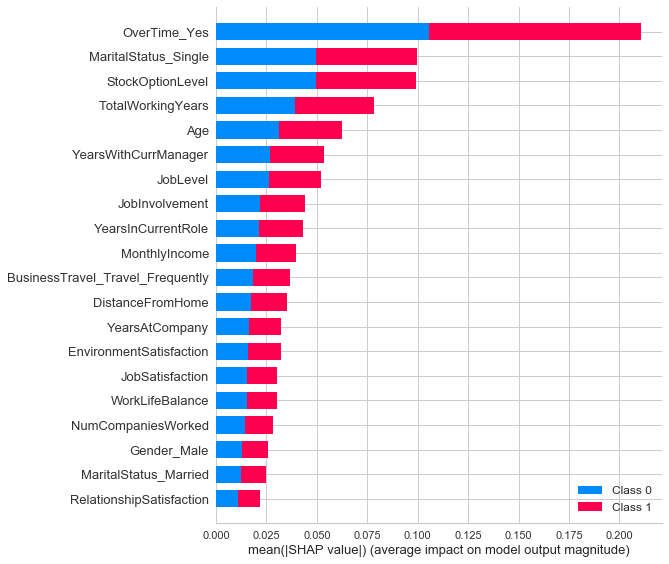

In [87]:
## Feature-feature mana saja yang berpengaruh terhadap model kita dan performa model kita ##
## Karena sebenarnya feature-feature itu sangat mempengaruhi performa model kita ##
shap.summary_plot(shap_val,X_train_os)

#### Cross validation (using oversampled data)

Berdasarkan perbandingan Hasil Accuracy Score menggunakan Hyperparameter Tuning antara Original Data dan Oversampled terlihat prediksi pada Accuracy Oversampled data menggunakan Random Forest memiliki score yang paling baik.


##### KFold (Untuk cek kestabilan Model Machine Learning)

In [153]:
kf = KFold(n_splits = 5, shuffle = True, random_state = 101)

In [154]:
def calc_train_error(X_train, y_train, model):
    predictions = model.predict(X_train)
    predictProba = model.predict_proba(X_train)
    matt = matthews_corrcoef(y_train, predictions)
    f1 = f1_score(y_train, predictions, average = 'macro')
    report = classification_report(y_train, predictions)
    roc_auc = roc_auc_score(y_train, predictProba[:, 1])
    accuracy = accuracy_score(y_train, predictions)
    confMatrix = confusion_matrix(y_train, predictions)
    logloss = log_loss(y_train, predictProba)
    return{
        'report' : report,
        'matthew' : matt,
        'f1' : f1,
        'roc' : roc_auc,
        'accuracy' : accuracy,
        'confusion' : confMatrix,
        'logloss' : logloss
    }

def calc_validation_error(X_test, y_test, model):
    predictions = model.predict(X_test)
    predictProba = model.predict_proba(X_test)
    matt = matthews_corrcoef(y_test, predictions)
    f1 = f1_score(y_test, predictions, average = 'macro')
    report = classification_report(y_test, predictions)
    roc_auc = roc_auc_score(y_test, predictProba[:, 1])
    accuracy = accuracy_score(y_test, predictions)
    confMatrix = confusion_matrix(y_test, predictions)
    logloss = log_loss(y_test, predictProba)
    return{
        'report' : report,
        'matthew' : matt,
        'f1' : f1,
        'roc' : roc_auc,
        'accuracy' : accuracy,
        'confusion' : confMatrix,
        'logloss' : logloss
    }

def calc_metrics(X_train, y_train, X_test, y_test, model):
    model.fit(X_train, y_train)
    train_error = calc_train_error(X_train, y_train, model)
    validation_error = calc_validation_error(X_test, y_test, model)
    return train_error, validation_error

In [155]:
train_errors = []
validation_errors = []
smote = SMOTE(sampling_strategy = 'minority',random_state = 101)
for train_index, val_index in kf.split(X,y):
    
    # split data
    X_train, X_val = X.iloc[train_index], X.iloc[val_index]
    y_train, y_val = y.iloc[train_index], y.iloc[val_index]
    
    #Oversampling
    X_train_os, y_train_os = smote.fit_sample(X_train, y_train)
    
    # instantiative model
    rf_os_best_acc = RandomForestClassifier(n_estimators = 100, min_samples_split = 10, min_samples_leaf = 5,
                                            max_features = 'auto', max_depth = 20, criterion = 'gini', bootstrap = False)
    # calculate errors
    train_error, val_error = calc_metrics(X_train_os, y_train_os, X_val, y_val, rf_os_best_acc)
    # append to appropriate list
    train_errors.append(train_error)
    validation_errors.append(val_error)

In [156]:
for i, tr_err in zip(range(1, 6), train_errors):
    print(f'Report Train ke {i}')
    print(tr_err['report'])

Report Train ke 1
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       984
           1       1.00      0.98      0.99       984

    accuracy                           0.99      1968
   macro avg       0.99      0.99      0.99      1968
weighted avg       0.99      0.99      0.99      1968

Report Train ke 2
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       991
           1       1.00      0.98      0.99       991

    accuracy                           0.99      1982
   macro avg       0.99      0.99      0.99      1982
weighted avg       0.99      0.99      0.99      1982

Report Train ke 3
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      1000
           1       1.00      0.98      0.99      1000

    accuracy                           0.99      2000
   macro avg       0.99      0.99      0.99      2000
weighted avg       0

In [157]:
for i, val_err in zip(range(1, 6), validation_errors):
    print(f'Report Train ke {i}')
    print(val_err['report'])

Report Train ke 1
              precision    recall  f1-score   support

           0       0.89      0.96      0.92       249
           1       0.62      0.33      0.43        45

    accuracy                           0.87       294
   macro avg       0.76      0.65      0.68       294
weighted avg       0.85      0.87      0.85       294

Report Train ke 2
              precision    recall  f1-score   support

           0       0.86      0.98      0.91       242
           1       0.67      0.23      0.34        52

    accuracy                           0.84       294
   macro avg       0.76      0.60      0.63       294
weighted avg       0.82      0.84      0.81       294

Report Train ke 3
              precision    recall  f1-score   support

           0       0.83      0.98      0.90       233
           1       0.74      0.23      0.35        61

    accuracy                           0.82       294
   macro avg       0.78      0.60      0.62       294
weighted avg       0

In [158]:
data = list()
for tr_err, val_err in zip(train_errors, validation_errors):
    data_row = list()
    for param in 'accuracy', 'roc', 'f1', 'matthew logloss':
        data_row.append('')
    data.append([tr_err['accuracy'], val_err['accuracy'],
               tr_err['roc'], val_err['roc'],
               tr_err['f1'], val_err['f1'],
               tr_err['matthew'], val_err['matthew'],
               tr_err['logloss'], val_err['logloss']])

tabel_1 = pd.DataFrame(data, index = ['1 Iteration', '2 Iteration', '3 Iteration', '4 Iteration', '5 Iteration'],
                    columns = ['Train Accuracy', 'Test Accuracy', 'Train ROC AUC', 'Test ROC AUC',
                              'Train F1 Score', 'Test F1 Score', 'Train Matthews Corr Coef', 'Test Matthews Corr Coef',
                              'Train Log Loss', 'Test Log Loss'])

mean = list()
for i in tabel_1:
    mean.append(tabel_1[i].mean())
    
tabel_2 = pd.DataFrame(mean, index = tabel_1.columns, columns = ['Average'])

pd.concat([tabel_1, tabel_2.transpose()]) 

,Train Accuracy,Test Accuracy,Train ROC AUC,Test ROC AUC,Train F1 Score,Test F1 Score,Train Matthews Corr Coef,Test Matthews Corr Coef,Train Log Loss,Test Log Loss
1 Iteration,0.991870,0.867347,0.999919,0.759572,0.991870,0.679819,0.983839,0.390797,0.127436,0.376436
2 Iteration,0.988396,0.843537,0.999923,0.780912,0.988394,0.627027,0.977054,0.327820,0.124286,0.388641
3 Iteration,0.991500,0.823129,0.999918,0.802434,0.991500,0.623819,0.983083,0.343135,0.123074,0.412881
4 Iteration,0.991812,0.904762,0.999975,0.897512,0.991811,0.761059,0.983755,0.531250,0.134285,0.316420
5 Iteration,0.990306,0.880952,0.999955,0.829461,0.990305,0.688889,0.980760,0.407942,0.128986,0.339544
Average,0.990777,0.863946,0.999938,0.813978,0.990776,0.676123,0.981698,0.400189,0.127614,0.366785


##### Validation Cross Val Score
Untuk cek kestabilan model, output masih mendekati mean

Cross validation scores: [0.86486486 0.85810811 0.85135135 0.85714286 0.86394558 0.85034014
 0.85034014 0.87671233 0.87671233 0.87671233]


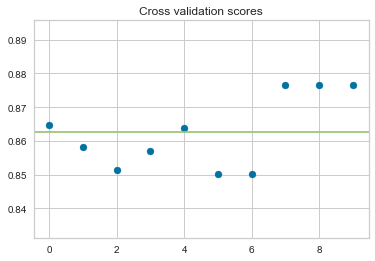

In [159]:
## Using SMOTE via Pipeline
from sklearn.model_selection import cross_val_score
from imblearn.pipeline import make_pipeline

estimator=make_pipeline((SMOTE()),(rf_os_best_acc))
scores = cross_val_score(estimator = estimator,
                        X = X,
                        y = y,
                        cv = 10,
                        n_jobs = -1)

print('Cross validation scores: %s' %(scores))

plt.title('Cross validation scores')
plt.scatter(np.arange(len(scores)), scores)
plt.axhline(y=np.mean(scores), color='g') # Mean value of cross validation scores
plt.show()

Cross validation scores: [0.83783784 0.85135135 0.86486486 0.85034014 0.89115646 0.85714286
 0.83673469 0.87671233 0.84931507 0.86986301]


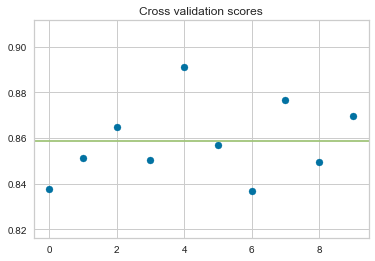

In [160]:
## without SMOTE
from sklearn.model_selection import cross_val_score
from imblearn.pipeline import make_pipeline

# estimator=make_pipeline((SMOTE()),(rf_os_best_acc))
scores = cross_val_score(estimator = rf_os_best_acc,
                        X = X,
                        y = y,
                        cv = 10,
                        n_jobs = -1)

print('Cross validation scores: %s' %(scores))

plt.title('Cross validation scores')
plt.scatter(np.arange(len(scores)), scores)
plt.axhline(y=np.mean(scores), color='g') # Mean value of cross validation scores
plt.show()

##### Learning Curve (Untuk cek kelayakan model)

[[0.94402421 0.94251135 0.94251135 0.94553707 0.94251135 0.95007564
  0.94402421 0.93948563 0.94402421 0.94553707]
 [0.9369483  0.93442623 0.9445145  0.9445145  0.94199243 0.9445145
  0.9445145  0.9407314  0.9407314  0.9407314 ]
 [0.94162162 0.93837838 0.94378378 0.95027027 0.9427027  0.94378378
  0.94594595 0.94594595 0.9427027  0.9372973 ]
 [0.9422895  0.9385052  0.94323557 0.94418165 0.93661306 0.94323557
  0.94418165 0.94418165 0.9422895  0.94512772]
 [0.94449117 0.94196804 0.941127   0.94617325 0.93860387 0.94449117
  0.94449117 0.94533221 0.93608074 0.94449117]
 [0.94251135 0.94251135 0.94175492 0.94402421 0.94326778 0.94704992
  0.94553707 0.94629349 0.94175492 0.94326778]]
[0.94402421 0.94136192 0.94324324 0.94238411 0.94272498 0.94379728]
[ 661  793  925 1057 1189 1322]


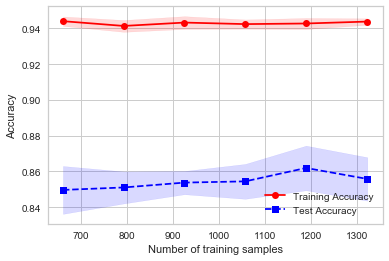

In [161]:
#Learning Curve without SMOTE

from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=rf_os_best_acc, ## fit without SMOTE
                                                       X=X,
                                                       y=y,
                                                       train_sizes=np.linspace(0.5, 1.0, 6),
                                                       cv=10)

print(train_scores)
# Mean value of accuracy against training data
train_mean = np.mean(train_scores, axis=1)
print(train_mean)
print(train_sizes)
# Standard deviation of training accuracy per number of training samples
train_std = np.std(train_scores, axis=1)

# Same as above for test data
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot training accuracies 
plt.plot(train_sizes, train_mean, color='red', marker='o', label='Training Accuracy')
# Plot the variance of training accuracies
plt.fill_between(train_sizes,
                train_mean + train_std,
                train_mean - train_std,
                alpha=0.15, color='red')

# Plot for test data as training data
plt.plot(train_sizes, test_mean, color='blue', linestyle='--', marker='s', 
        label='Test Accuracy')
plt.fill_between(train_sizes,
                test_mean + test_std,
                test_mean - test_std,
                alpha=0.15, color='blue')

plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

[[0.98940998 0.98184569 0.98487141 0.98184569 0.98033283 0.98638427
  0.98184569 0.98335855 0.98940998 0.98789713]
 [0.98738966 0.98486759 0.98865069 0.9924338  0.98360656 0.98738966
  0.97982346 0.98360656 0.98486759 0.97982346]
 [0.98378378 0.98378378 0.98702703 0.98054054 0.98486486 0.98918919
  0.98702703 0.98702703 0.98486486 0.9827027 ]
 [0.98675497 0.98770104 0.98297067 0.98864711 0.98959319 0.9820246
  0.9782403  0.98770104 0.98770104 0.9820246 ]
 [0.9823381  0.98402019 0.98317914 0.98738436 0.98990749 0.98149706
  0.9882254  0.98654331 0.98738436 0.9823381 ]
 [0.98335855 0.99092284 0.98638427 0.98638427 0.98638427 0.98638427
  0.98940998 0.98487141 0.98260212 0.98260212]]
[0.98472012 0.9852459  0.98508108 0.98533586 0.98528175 0.98593041]
[ 661  793  925 1057 1189 1322]


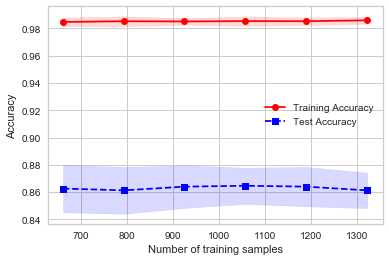

In [162]:
#Learning Curve with SMOTE

from sklearn.model_selection import learning_curve

train_sizes, train_scores, test_scores = learning_curve(estimator=estimator,##pipeline_rf_os ganti nama estimator ##SMOTE first then fit model
                                                       X=X,
                                                       y=y,
                                                       train_sizes=np.linspace(0.5, 1.0, 6),
                                                       cv=10)

print(train_scores)
# Mean value of accuracy against training data
train_mean = np.mean(train_scores, axis=1)
print(train_mean)
print(train_sizes)
# Standard deviation of training accuracy per number of training samples
train_std = np.std(train_scores, axis=1)

# Same as above for test data
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

# Plot training accuracies 
plt.plot(train_sizes, train_mean, color='red', marker='o', label='Training Accuracy')
# Plot the variance of training accuracies
plt.fill_between(train_sizes,
                train_mean + train_std,
                train_mean - train_std,
                alpha=0.15, color='red')

# Plot for test data as training data
plt.plot(train_sizes, test_mean, color='blue', linestyle='--', marker='s', 
        label='Test Accuracy')
plt.fill_between(train_sizes,
                test_mean + test_std,
                test_mean - test_std,
                alpha=0.15, color='blue')

plt.xlabel('Number of training samples')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

#### Feature Impotance Compare (Logistic) to Feature Selection

#### Logistic Model

In [184]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy()))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                  Results: Logit
Model:                    Logit                 Pseudo R-squared:      0.391      
Dependent Variable:       y                     AIC:                   1746.0470  
Date:                     2019-11-18 20:59      BIC:                   1997.1785  
No. Observations:         1960                  Log-Likelihood:        -828.02    
Df Model:                 44                    LL-Null:               -1358.6    
Df Residuals:             1915                  LLR p-value:           1.3049e-193
Converged:                0.0000                Scale:                 1.0000     
No. Iterations:           35.0000                                                 
----------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
----------------------------------------------------------------------------------
const                             -1.1

In [185]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                  Results: Logit
Model:                    Logit                 Pseudo R-squared:      0.391      
Dependent Variable:       y                     AIC:                   1744.0945  
Date:                     2019-11-18 21:00      BIC:                   1989.6453  
No. Observations:         1960                  Log-Likelihood:        -828.05    
Df Model:                 43                    LL-Null:               -1358.6    
Df Residuals:             1916                  LLR p-value:           2.6694e-194
Converged:                0.0000                Scale:                 1.0000     
No. Iterations:           35.0000                                                 
----------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
----------------------------------------------------------------------------------
const                             -1.1

In [186]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating','JobRole_Manager'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                  Results: Logit
Model:                    Logit                 Pseudo R-squared:      0.390      
Dependent Variable:       y                     AIC:                   1742.1561  
Date:                     2019-11-18 21:02      BIC:                   1982.1262  
No. Observations:         1960                  Log-Likelihood:        -828.08    
Df Model:                 42                    LL-Null:               -1358.6    
Df Residuals:             1917                  LLR p-value:           5.4327e-195
Converged:                0.0000                Scale:                 1.0000     
No. Iterations:           35.0000                                                 
----------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
----------------------------------------------------------------------------------
const                             -1.1

In [187]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating','JobRole_Manager','HourlyRate'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                  Results: Logit
Model:                    Logit                 Pseudo R-squared:      0.390      
Dependent Variable:       y                     AIC:                   1740.8456  
Date:                     2019-11-18 21:03      BIC:                   1975.2350  
No. Observations:         1960                  Log-Likelihood:        -828.42    
Df Model:                 41                    LL-Null:               -1358.6    
Df Residuals:             1918                  LLR p-value:           1.4782e-195
Converged:                0.0000                Scale:                 1.0000     
No. Iterations:           35.0000                                                 
----------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
----------------------------------------------------------------------------------
const                             -1.1

In [188]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating','JobRole_Manager','HourlyRate','MonthlyRate'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                  Results: Logit
Model:                    Logit                 Pseudo R-squared:      0.390      
Dependent Variable:       y                     AIC:                   1739.9301  
Date:                     2019-11-18 21:04      BIC:                   1968.7388  
No. Observations:         1960                  Log-Likelihood:        -828.97    
Df Model:                 40                    LL-Null:               -1358.6    
Df Residuals:             1919                  LLR p-value:           4.8080e-196
Converged:                0.0000                Scale:                 1.0000     
No. Iterations:           35.0000                                                 
----------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
----------------------------------------------------------------------------------
const                             -1.1

In [189]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating','JobRole_Manager','HourlyRate','MonthlyRate','Department_Sales'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                  Results: Logit
Model:                    Logit                 Pseudo R-squared:      0.389      
Dependent Variable:       y                     AIC:                   1740.4577  
Date:                     2019-11-18 21:05      BIC:                   1963.6857  
No. Observations:         1960                  Log-Likelihood:        -830.23    
Df Model:                 39                    LL-Null:               -1358.6    
Df Residuals:             1920                  LLR p-value:           3.1010e-196
Converged:                0.0000                Scale:                 1.0000     
No. Iterations:           35.0000                                                 
----------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
----------------------------------------------------------------------------------
const                             -1.1

In [190]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating','JobRole_Manager','HourlyRate','MonthlyRate','Department_Sales','EducationField_Technical Degree'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                  Results: Logit
Model:                    Logit                 Pseudo R-squared:      0.389      
Dependent Variable:       y                     AIC:                   1738.7304  
Date:                     2019-11-18 21:06      BIC:                   1956.3777  
No. Observations:         1960                  Log-Likelihood:        -830.37    
Df Model:                 38                    LL-Null:               -1358.6    
Df Residuals:             1921                  LLR p-value:           6.6580e-197
Converged:                0.0000                Scale:                 1.0000     
No. Iterations:           35.0000                                                 
----------------------------------------------------------------------------------
                                   Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
----------------------------------------------------------------------------------
const                             -1.1

In [79]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating','Education','HourlyRate','JobRole_Manager','JobRole_Manufacturing Director','MonthlyRate','Department_Sales','Department_Research & Development'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                 Results: Logit
Model:                   Logit                 Pseudo R-squared:      0.388      
Dependent Variable:      y                     AIC:                   1736.1519  
Date:                    2019-11-18 17:20      BIC:                   1942.6377  
No. Observations:        1960                  Log-Likelihood:        -831.08    
Df Model:                36                    LL-Null:               -1358.6    
Df Residuals:            1923                  LLR p-value:           4.5051e-198
Converged:               0.0000                Scale:                 1.0000     
No. Iterations:          35.0000                                                 
---------------------------------------------------------------------------------
                                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
---------------------------------------------------------------------------------
const                            -1.1389   0.0846 

In [191]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating','Education','HourlyRate','JobRole_Manager','JobRole_Manufacturing Director','MonthlyRate','Department_Sales','Department_Research & Development','EducationField_Technical Degree'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                 Results: Logit
Model:                   Logit                 Pseudo R-squared:      0.388      
Dependent Variable:      y                     AIC:                   1734.3586  
Date:                    2019-11-18 21:08      BIC:                   1935.2638  
No. Observations:        1960                  Log-Likelihood:        -831.18    
Df Model:                35                    LL-Null:               -1358.6    
Df Residuals:            1924                  LLR p-value:           8.9966e-199
Converged:               1.0000                Scale:                 1.0000     
No. Iterations:          34.0000                                                 
---------------------------------------------------------------------------------
                                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
---------------------------------------------------------------------------------
const                            -1.1369   0.0845 

In [192]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating','Education','HourlyRate','JobRole_Manager','JobRole_Manufacturing Director','MonthlyRate','Department_Sales','Department_Research & Development','EducationField_Technical Degree','PercentSalaryHike'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                 Results: Logit
Model:                   Logit                 Pseudo R-squared:      0.387      
Dependent Variable:      y                     AIC:                   1734.5281  
Date:                    2019-11-18 21:08      BIC:                   1929.8526  
No. Observations:        1960                  Log-Likelihood:        -832.26    
Df Model:                34                    LL-Null:               -1358.6    
Df Residuals:            1925                  LLR p-value:           4.5862e-199
Converged:               0.0000                Scale:                 1.0000     
No. Iterations:          35.0000                                                 
---------------------------------------------------------------------------------
                                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
---------------------------------------------------------------------------------
const                            -1.1291   0.0841 

In [193]:
import statsmodels.api as sm
logit_model = sm.Logit(y_train_os,sm.add_constant(pd.DataFrame(X_train_os,columns=X.columns).copy().drop(['PerformanceRating','Education','HourlyRate','JobRole_Manager','JobRole_Manufacturing Director','MonthlyRate','Department_Sales','Department_Research & Development','EducationField_Technical Degree','PercentSalaryHike','EducationField_Marketing'],axis=1)))
result = logit_model.fit(method ='lbfgs')
print(result.summary2())

                                 Results: Logit
Model:                   Logit                 Pseudo R-squared:      0.386      
Dependent Variable:      y                     AIC:                   1735.7661  
Date:                    2019-11-18 21:09      BIC:                   1925.5098  
No. Observations:        1960                  Log-Likelihood:        -833.88    
Df Model:                33                    LL-Null:               -1358.6    
Df Residuals:            1926                  LLR p-value:           3.8750e-199
Converged:               1.0000                Scale:                 1.0000     
No. Iterations:          34.0000                                                 
---------------------------------------------------------------------------------
                                  Coef.  Std.Err.    z     P>|z|   [0.025  0.975]
---------------------------------------------------------------------------------
const                            -1.1253   0.0838 

> Based on Feature Importance and Permutation Importance, we can see that there are 2 features that are likely to greatly influence the prediction results of the model we use : Overtime (Yes) dan Stock Option Level.

> By using the shape method we can find out the possible causes of the probability of our employees leaving, as in the example above I use the 8th sample from the X_train_os data.

> As a consideration in selecting features for the Feature Engineering process, I use Statmodels from Logistic Regression to see the relationship of our features to our target.

> From the comparison of feature selection using various different methods, I try to make a Feature Selection, I will eliminate some features that I think are less relevant to predict our target, while features that are relevant to the prediction model will be saved as features that I I will use to predict targets, including:
- 1. Age;
- 2. DistanceFromHome;
- 3. Education;
- 4. EnvironmentSatisfaction ;
- 5. JobInvolvement;
- 6. JobLevel;
- 7. JobSatisfaction;
- 8. MonthlyIncome;
- 9. RelationshipSatisfaction;
- 10. StockOptionLevel;
- 11. TotalWorkingYears;
- 12. TrainingTimesLastYear;
- 13. YearsAtCompany;
- 14. YearsInCurrentRole;
- 15. YearsWithCurrManager;
- 16. Gender_Male;
- 17. MaritalStatus_Single;
- 18. OverTime_Yes.

### Feature Engineering from Feature Selection Model

>- Based on a comparison of the results of Features Importance & Permutation using the Random Forest and Pvalue models on statsmodels using Logistic Regression, we can select features and perform feature engineering.

>- In this case I will do Features Engineering by removing some of features that in my opinion are not strongly related to our target.

In [43]:
IBM.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
Age                         1470 non-null int64
Attrition                   1470 non-null object
BusinessTravel              1470 non-null object
DailyRate                   1470 non-null int64
Department                  1470 non-null object
DistanceFromHome            1470 non-null int64
Education                   1470 non-null int64
EducationField              1470 non-null object
EnvironmentSatisfaction     1470 non-null int64
Gender                      1470 non-null object
HourlyRate                  1470 non-null int64
JobInvolvement              1470 non-null int64
JobLevel                    1470 non-null int64
JobRole                     1470 non-null object
JobSatisfaction             1470 non-null int64
MaritalStatus               1470 non-null object
MonthlyIncome               1470 non-null int64
MonthlyRate                 1470 non-null int64
NumCompaniesWorked    

In [44]:
IBM_dummies

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,Gender_Male,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single,OverTime_Yes
0,41,1,1102,1,2,2,94,3,2,4,5993,19479,8,11,3,1,0,8,0,1,6,4,0,5,0,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,1
1,49,0,279,8,1,3,61,2,2,2,5130,24907,1,23,4,4,1,10,3,3,10,7,1,7,1,0,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0
2,37,1,1373,2,2,4,92,2,1,3,2090,2396,6,15,3,2,0,7,3,3,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,0,0,0,0,0,0,0,1,1
3,33,0,1392,3,4,4,56,3,1,3,2909,23159,1,11,3,3,0,8,3,3,8,7,3,0,1,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1
4,27,0,591,2,1,1,40,3,1,2,3468,16632,9,12,3,4,1,6,3,3,2,2,2,2,0,1,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0
5,32,0,1005,2,2,4,79,3,1,4,3068,11864,0,13,3,3,0,8,2,2,7,7,3,6,1,0,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0
6,59,0,1324,3,3,3,81,4,1,1,2670,9964,4,20,4,1,3,12,3,2,1,0,0,0,0,1,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1
7,30,0,1358,24,1,4,67,3,1,3,2693,13335,1,22,4,2,1,1,2,3,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
8,38,0,216,23,3,4,44,2,3,3,9526,8787,0,21,4,2,0,10,2,3,9,7,1,8,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0
9,36,0,1299,27,3,3,94,3,2,3,5237,16577,6,13,3,2,2,17,3,2,7,7,7,7,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [45]:
IBM_dummies_new = IBM_dummies.drop(['DailyRate','HourlyRate','MonthlyRate','NumCompaniesWorked',
                                    'PercentSalaryHike','PerformanceRating','WorkLifeBalance',
                                    'YearsSinceLastPromotion','BusinessTravel_Travel_Frequently',
                                    'BusinessTravel_Travel_Rarely','Department_Research & Development','Department_Sales',
                                    'EducationField_Life Sciences','EducationField_Marketing','EducationField_Medical',
                                    'EducationField_Other','EducationField_Technical Degree','JobRole_Human Resources',
                                    'JobRole_Laboratory Technician','JobRole_Manager','JobRole_Manufacturing Director',
                                    'JobRole_Research Director','JobRole_Research Scientist','JobRole_Sales Executive',
                                    'JobRole_Sales Representative','MaritalStatus_Married'], axis=1)
IBM_dummies_new

,Age,Attrition,DistanceFromHome,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,Gender_Male,MaritalStatus_Single,OverTime_Yes
0,41,1,1,2,2,3,2,4,5993,1,0,8,0,6,4,5,0,1,1
1,49,0,8,1,3,2,2,2,5130,4,1,10,3,10,7,7,1,0,0
2,37,1,2,2,4,2,1,3,2090,2,0,7,3,0,0,0,1,1,1
3,33,0,3,4,4,3,1,3,2909,3,0,8,3,8,7,0,0,0,1
4,27,0,2,1,1,3,1,2,3468,4,1,6,3,2,2,2,1,0,0
5,32,0,2,2,4,3,1,4,3068,3,0,8,2,7,7,6,1,1,0
6,59,0,3,3,3,4,1,1,2670,1,3,12,3,1,0,0,0,0,1
7,30,0,24,1,4,3,1,3,2693,2,1,1,2,1,0,0,1,0,0
8,38,0,23,3,4,2,3,3,9526,2,0,10,2,9,7,8,1,1,0
9,36,0,27,3,3,3,2,3,5237,2,2,17,3,7,7,7,1,0,0


In [141]:
IBM_dummies_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 19 columns):
Age                         1470 non-null int64
Attrition                   1470 non-null int64
DistanceFromHome            1470 non-null int64
Education                   1470 non-null int64
EnvironmentSatisfaction     1470 non-null int64
JobInvolvement              1470 non-null int64
JobLevel                    1470 non-null int64
JobSatisfaction             1470 non-null int64
MonthlyIncome               1470 non-null int64
RelationshipSatisfaction    1470 non-null int64
StockOptionLevel            1470 non-null int64
TotalWorkingYears           1470 non-null int64
TrainingTimesLastYear       1470 non-null int64
YearsAtCompany              1470 non-null int64
YearsInCurrentRole          1470 non-null int64
YearsWithCurrManager        1470 non-null int64
Gender_Male                 1470 non-null uint8
MaritalStatus_Single        1470 non-null uint8
OverTime_Yes                1

In [100]:
## Just for Dashboard DataTable
IBM_dashboard_dummies = IBM_dummies_new
IBM_dashboard_dummies['Attrition'] = IBM_dummies_new['Attrition'].replace({0:'No',1:'Yes'})
IBM_dashboard_dummies['Education'] = IBM_dummies_new['Education'].replace({1:'Below College',2:'College',3:'Bachelor',4:'Master',5:'Doctor'})
IBM_dashboard_dummies['EnvironmentSatisfaction'] = IBM_dummies_new['EnvironmentSatisfaction'].replace({1:'Low',2:'Medium',3:'High',4:'Very High'})
IBM_dashboard_dummies['JobInvolvement'] = IBM_dummies_new['JobInvolvement'].replace({1:'Low',2:'Medium',3:'High',4:'Very High'})
IBM_dashboard_dummies['JobLevel'] = IBM_dummies_new['JobLevel'].replace({1:'General Staff',2:'Supervisor',3:'Junior Manager',4:'Senior Manager',5:'Executive'})
IBM_dashboard_dummies['JobSatisfaction'] = IBM_dummies_new['JobSatisfaction'].replace({1:'Low',2:'Medium',3:'High',4:'Very High'})
IBM_dashboard_dummies['RelationshipSatisfaction'] = IBM_dummies_new['RelationshipSatisfaction'].replace({1:'Low',2:'Medium',3:'High',4:'Very High'})
IBM_dashboard_dummies['Gender_Male'] = IBM_dummies_new['Gender_Male'].replace({0:'No',1:'Yes'})
IBM_dashboard_dummies['MaritalStatus_Single'] = IBM_dummies_new['MaritalStatus_Single'].replace({0:'No',1:'Yes'})  
IBM_dashboard_dummies['OverTime_Yes'] = IBM_dummies_new['OverTime_Yes'].replace({0:'No',1:'Yes'}) 
IBM_dashboard_dummies.head()

,Age,Attrition,DistanceFromHome,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,Gender_Male,MaritalStatus_Single,OverTime_Yes
0,41,Yes,1,College,Medium,High,Supervisor,Very High,5993,Low,0,8,0,6,4,5,No,Yes,Yes
1,49,No,8,Below College,High,Medium,Supervisor,Medium,5130,Very High,1,10,3,10,7,7,Yes,No,No
2,37,Yes,2,College,Very High,Medium,General Staff,High,2090,Medium,0,7,3,0,0,0,Yes,Yes,Yes
3,33,No,3,Master,Very High,High,General Staff,High,2909,High,0,8,3,8,7,0,No,No,Yes
4,27,No,2,Below College,Low,High,General Staff,Medium,3468,Very High,1,6,3,2,2,2,Yes,No,No


In [101]:
IBM_dashboard_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 19 columns):
Age                         1470 non-null int64
Attrition                   1470 non-null object
DistanceFromHome            1470 non-null int64
Education                   1470 non-null object
EnvironmentSatisfaction     1470 non-null object
JobInvolvement              1470 non-null object
JobLevel                    1470 non-null object
JobSatisfaction             1470 non-null object
MonthlyIncome               1470 non-null int64
RelationshipSatisfaction    1470 non-null object
StockOptionLevel            1470 non-null int64
TotalWorkingYears           1470 non-null int64
TrainingTimesLastYear       1470 non-null int64
YearsAtCompany              1470 non-null int64
YearsInCurrentRole          1470 non-null int64
YearsWithCurrManager        1470 non-null int64
Gender_Male                 1470 non-null object
MaritalStatus_Single        1470 non-null object
OverTime_Yes        

#### Preprocessing (Feature Scaling)

In [46]:
scaler = StandardScaler()
IBM_dummies_new_standard = IBM_dummies_new.copy()
IBM_dummies_new_standard.drop(['Attrition'],axis = 1, inplace = True)

In [47]:
scaler.fit(IBM_dummies_new_standard)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [48]:
scaled_data_new = scaler.transform(IBM_dummies_new_standard)

#### New Data and Target

In [49]:
X_new = pd.DataFrame(scaled_data_new,columns = IBM_dummies_new_standard.columns)
y_new = IBM_dummies['Attrition']
concat_scaled_data_new = pd.concat([X_new,y_new],axis = 1)
concat_scaled_data_new.head()

,Age,DistanceFromHome,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,Gender_Male,MaritalStatus_Single,OverTime_Yes,Attrition
0,0.446350,-1.010909,-0.891688,-0.660531,0.379672,-0.057788,1.153254,-0.108350,-1.584178,-0.932014,-0.421642,-2.171982,-0.164613,-0.063296,0.245834,-1.224745,1.458650,1.591746,1
1,1.322365,-0.147150,-1.868426,0.254625,-1.026167,-0.057788,-0.660853,-0.291719,1.191438,0.241988,-0.164511,0.155707,0.488508,0.764998,0.806541,0.816497,-0.685565,-0.628241,0
2,0.008343,-0.887515,-0.891688,1.169781,-1.026167,-0.961486,0.246200,-0.937654,-0.658973,-0.932014,-0.550208,0.155707,-1.144294,-1.167687,-1.155935,0.816497,1.458650,1.591746,1
3,-0.429664,-0.764121,1.061787,1.169781,0.379672,-0.961486,0.246200,-0.763634,0.266233,-0.932014,-0.421642,0.155707,0.161947,0.764998,-1.155935,-1.224745,-0.685565,1.591746,0
4,-1.086676,-0.887515,-1.868426,-1.575686,0.379672,-0.961486,-0.660853,-0.644858,1.191438,0.241988,-0.678774,0.155707,-0.817734,-0.615492,-0.595227,0.816497,-0.685565,-0.628241,0


#### Splitting the data into training and validation sets

In [50]:
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size=0.3, random_state=101)

In [155]:
X_new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 18 columns):
Age                         1470 non-null float64
DistanceFromHome            1470 non-null float64
Education                   1470 non-null float64
EnvironmentSatisfaction     1470 non-null float64
JobInvolvement              1470 non-null float64
JobLevel                    1470 non-null float64
JobSatisfaction             1470 non-null float64
MonthlyIncome               1470 non-null float64
RelationshipSatisfaction    1470 non-null float64
StockOptionLevel            1470 non-null float64
TotalWorkingYears           1470 non-null float64
TrainingTimesLastYear       1470 non-null float64
YearsAtCompany              1470 non-null float64
YearsInCurrentRole          1470 non-null float64
YearsWithCurrManager        1470 non-null float64
Gender_Male                 1470 non-null float64
MaritalStatus_Single        1470 non-null float64
OverTime_Yes                1470 non-null f

In [51]:
y_new.value_counts()

0    1233
1     237
Name: Attrition, dtype: int64

#### Modelling Feature Engineering

In [52]:
rf_os_best_acc = RandomForestClassifier(n_estimators = 100, min_samples_split = 10, min_samples_leaf = 5,
                                        max_features = 'auto', max_depth = 20, criterion = 'gini', bootstrap = False,random_state = 101)

In [53]:
rf_os_best_acc.fit(X_train_new,y_train_new)

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=20, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)

In [54]:
Original_data_featengine = pd.DataFrame(calc_acc(X_train_new, y_train_new, X_test_new, y_test_new, rf_os_best_acc),
                index = ['Train Normal Data','Test Normal Data'],columns = ['Accuracy'])
print(Original_data_featengine)

                   Accuracy
Train Normal Data  0.931001
Test Normal Data   0.850340


> **(-) Based on the results above it can be seen that there is still overfitting of our prediction model.**

> **(+) By doing Feature Engineering, our prediction model looks better in terms of predicting our test data.We can see the results of the calculation of the accuracy of our initial data below:**
 
> - **Accuracy (Original Data)** :

>Train Normal Data : 0.979592;
>Test Normal Data : 0.843537

>- **Accuracy (Oversampled Original Data)** :

>Train Oversample Data : 0.99420;
>Test Oversample Data : 0.84127

In [164]:
import category_encoders
category_encoders.__version__

'2.1.0'

In [162]:
import pickle
pickle.dump(rf_os_best_acc, open('pickle_Random_Forest_os_best_accuracy.sav','wb'))

In [60]:
import pickle
pickle.dump(IBM_dummies_new, open('pickle_IBM_dummies_new.csv','wb'))

In [62]:
import pickle
pickle.dump(scaler,open('pickle_Standard_Scaler.sav','wb'))

In [51]:
import pickle
pickle.dump(IBM_dashboard_dummies,open('pickle_IBM_dashboard_dummies.csv','wb'))

In [57]:
import pickle
loadModel = pickle.load(open('pickle_Random_Forest_os_best_accuracy.sav','rb'))

In [58]:
loadModel

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=20, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)

In [60]:
#loadIBM = pickle.load(open('pickle_IBM_dummies_new.csv','rb'))
loadIBM.columns

Index(['Age', 'Attrition', 'DistanceFromHome', 'Education',
       'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel',
       'JobSatisfaction', 'MonthlyIncome', 'RelationshipSatisfaction',
       'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsWithCurrManager',
       'Gender_Male', 'MaritalStatus_Single', 'OverTime_Yes'],
      dtype='object')

In [61]:
#loadIBM.drop(['Attrition'],axis = 1, inplace =True)

In [87]:
#loadIBM.loc[0]

In [69]:
loadModel.predict([loadIBM.loc[2]])

array([0], dtype=int64)

In [70]:
loadIBM.columns

Index(['Age', 'DistanceFromHome', 'Education', 'EnvironmentSatisfaction',
       'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome',
       'RelationshipSatisfaction', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole',
       'YearsWithCurrManager', 'Gender_Male', 'MaritalStatus_Single',
       'OverTime_Yes'],
      dtype='object')

In [74]:
loadModel.predict([[41,89,4,2,5,6,4,57993,1,0,8,0,6,4,5,0,1,1]])

array([0], dtype=int64)

In [88]:
#loadScaler.fit(loadIBM)

In [240]:
#pickle.dump(loadScaler,open('pickle_Standard_Scaler.sav','wb'))

In [77]:
loadIBM.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 18 columns):
Age                         1470 non-null int64
DistanceFromHome            1470 non-null int64
Education                   1470 non-null int64
EnvironmentSatisfaction     1470 non-null int64
JobInvolvement              1470 non-null int64
JobLevel                    1470 non-null int64
JobSatisfaction             1470 non-null int64
MonthlyIncome               1470 non-null int64
RelationshipSatisfaction    1470 non-null int64
StockOptionLevel            1470 non-null int64
TotalWorkingYears           1470 non-null int64
TrainingTimesLastYear       1470 non-null int64
YearsAtCompany              1470 non-null int64
YearsInCurrentRole          1470 non-null int64
YearsWithCurrManager        1470 non-null int64
Gender_Male                 1470 non-null uint8
MaritalStatus_Single        1470 non-null uint8
OverTime_Yes                1470 non-null uint8
dtypes: int64(15), uint8(3)
m

In [78]:
loadScaler = pickle.load(open('pickle_Standard_Scaler.sav','rb'))

In [79]:
loadScaler.scale_.shape

(18,)

In [80]:
loadIBM.shape

(1470, 18)

In [81]:
to_predict=loadScaler.transform(np.array(loadIBM.loc[10]).reshape(1,-1))
to_predict

array([[-0.2106607 ,  0.84000413,  0.08504925, -1.57568627,  1.78551099,
        -0.96148639, -0.66085318, -0.86626086,  0.26623258,  0.24198831,
        -0.67877352,  1.70749969, -0.32789332, -0.0632959 , -0.31487349,
         0.81649658, -0.68556546, -0.62824112]])

In [82]:
loadModel

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=20, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=101,
                       verbose=0, warm_start=False)

In [83]:
for i in range(20):
    to_predict=loadScaler.transform(np.array(loadIBM.loc[i]).reshape(1,-1))
    print(loadModel.predict(to_predict))

[0]
[0]
[1]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[0]
[1]
[0]
[0]
[0]
[0]
[0]


In [84]:
for i in range(18):
    print(f'input_feat{i+1}')

input_feat1
input_feat2
input_feat3
input_feat4
input_feat5
input_feat6
input_feat7
input_feat8
input_feat9
input_feat10
input_feat11
input_feat12
input_feat13
input_feat14
input_feat15
input_feat16
input_feat17
input_feat18


In [85]:
#dimasukkan setelah import pickle
loadScaler = pickle.load(open('pickle_Standard_Scaler.sav','rb'))
loadModel = pickle.load(open('pickle_Random_Forest_os_best_accuracy.sav','rb'))

In [86]:
def predict_attrition(n_clicks, input_feat1,input_feat2,input_feat3,input_feat4,input_feat5,input_feat6,input_feat7,input_feat8,input_feat9,input_feat10,input_feat11,input_feat12,input_feat13,input_feat14,input_feat15,input_feat16,input_feat17,input_feat18):
    if n_clicks==None:
        return 'Please fill all the values'
    else:
        to_predict=loadScaler.transform(np.array([input_feat1,input_feat2,input_feat3,input_feat4,input_feat5,input_feat6,input_feat7,input_feat8,input_feat9,input_feat10,input_feat11,input_feat12,input_feat13,input_feat14,input_feat15,input_feat16,input_feat17,input_feat18]).reshape(1,-1))
        prediction=loadModel.predict(to_predict)[0]
        predict_proba=loadModel.predict_proba(to_predict)[0][prediction]
        if  prediction==0:
            Attrition = "No"
        else:
            Attrition = 'Yes'
        return 'Attrition prediction is {} with probability {}'.format(Attrition,round(predict_proba,2))

In [105]:
loadModel.predict_proba(np.array([-0.97717366,  1.82715799,  0.08504925,  0.25462493, -1.02616674,
       -0.96148639,  0.2462002 , -0.95082737, -0.65897283, -0.93201439,
       -0.67877352,  0.93160339, -0.49117353, -0.61549158, -0.31487349,
        0.81649658,  1.45864991,  1.59174553]).reshape(1,-1))

array([[0.21329762, 0.78670238]])

In [104]:
concat_scaled_data_new.iloc[14].values

array([-0.97717366,  1.82715799,  0.08504925,  0.25462493, -1.02616674,
       -0.96148639,  0.2462002 , -0.95082737, -0.65897283, -0.93201439,
       -0.67877352,  0.93160339, -0.49117353, -0.61549158, -0.31487349,
        0.81649658,  1.45864991,  1.59174553,  1.        ])

In [106]:
concat_scaled_data_new.head()

,Age,DistanceFromHome,Education,EnvironmentSatisfaction,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,YearsAtCompany,YearsInCurrentRole,YearsWithCurrManager,Gender_Male,MaritalStatus_Single,OverTime_Yes,Attrition
0,0.446350,-1.010909,-0.891688,-0.660531,0.379672,-0.057788,1.153254,-0.108350,-1.584178,-0.932014,-0.421642,-2.171982,-0.164613,-0.063296,0.245834,-1.224745,1.458650,1.591746,1
1,1.322365,-0.147150,-1.868426,0.254625,-1.026167,-0.057788,-0.660853,-0.291719,1.191438,0.241988,-0.164511,0.155707,0.488508,0.764998,0.806541,0.816497,-0.685565,-0.628241,0
2,0.008343,-0.887515,-0.891688,1.169781,-1.026167,-0.961486,0.246200,-0.937654,-0.658973,-0.932014,-0.550208,0.155707,-1.144294,-1.167687,-1.155935,0.816497,1.458650,1.591746,1
3,-0.429664,-0.764121,1.061787,1.169781,0.379672,-0.961486,0.246200,-0.763634,0.266233,-0.932014,-0.421642,0.155707,0.161947,0.764998,-1.155935,-1.224745,-0.685565,1.591746,0
4,-1.086676,-0.887515,-1.868426,-1.575686,0.379672,-0.961486,-0.660853,-0.644858,1.191438,0.241988,-0.678774,0.155707,-0.817734,-0.615492,-0.595227,0.816497,-0.685565,-0.628241,0


### Conclusion of Machine Learning Model 

> After ran the model multiple times and iterate to find the best value, I got some conclusions:
- Model is biased towards predicting non attrition.
- Random Forest is the best model for Accuracy Score.